In [ ]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.metrics import silhouette_score
import os

In [ ]:
pwd=os.getcwd()
imgs_path = pwd+"/data/Images/Original Images/"
n_imgs = 20
imgs = [cv2.imread(imgs_path + "img_{0:03d}.jpg".format(i)) for i in range(1, n_imgs + 1)]
seed = 42
np.random.seed(seed=seed)

In [ ]:
def pred_skin_color_mask(img, binary_mask):
    bgr_lower, bgr_upper, hsv_lower, hsv_upper = find_range(img, binary_mask)
    mask_BGR = cv2.inRange(img, bgr_lower, bgr_upper)
    mask_HSV = cv2.inRange(cv2.cvtColor(img, cv2.COLOR_BGR2HSV)[:, :, :-1], hsv_lower[:-1], hsv_upper[:-1])

    mask_combined = cv2.bitwise_and(mask_BGR, mask_HSV)

    return mask_combined

In [ ]:
class KMeans:

    def __init__(self, n_clusters, max_iter=100):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.centroids = None
        self.dim = None

    def initialize_centroids(self):
        self.centroids = np.random.randn(self.n_clusters, self.dim) * 255

    def fit(self, data):
        if not isinstance(data, np.ndarray):
            data = np.array(data)

        # Get vector dimension
        self.dim = data.shape[1]

        n_samples = data.shape[0]

        #Draw 1 sample from a multinomial distribution.
        labels = np.random.multinomial(1, np.ones(self.n_clusters)/self.n_clusters, n_samples)

        # Initialize for stop conditions
        old_centroids = None
        iter_ = 0

        # Train part
        while not self.should_stop(old_centroids, iter_):
            old_centroids = self.centroids
            iter_ += 1

            self.update_centroids(data, labels)
            labels = self.labels(data)

        # Return fitted centroids
        return self.centroids

    def should_stop(self, old_centroids, iter_):
        # Check centroids and old centroids values are assigned
        # np.allclose = Returns True if two arrays are element-wise equal within a tolerance.
        if (self.centroids is None) or (old_centroids is None):
            return False
        return (iter_ > self.max_iter) or np.allclose(old_centroids.ravel(), self.centroids.ravel())

    def labels(self, data):
        # Calculate distance matrix which is n_samples x n_clusters
        dist_mtx = calculate_dists(data, self.centroids)
        return np.eye(self.n_clusters)[dist_mtx.argmin(axis=1)]

    def predict(self, data):
        # Get labels
        labels = self.labels(data)

        # Get cluster ids from 0 to n_clusters - 1
        return labels.argmax(axis=1)

    def update_centroids(self, data, labels):
        #  Matrix Factorization approach for k-Means algorithm
        #  np.linalg.pinv() = Compute the (Moore-Penrose) pseudo-inverse of a matrix.
        self.centroids = np.linalg.pinv(labels.T.dot(labels)).dot(labels.T).dot(data)


def calculate_dists(X, M):
    # Note: these are not real distances
    # X^2 is not calculated, because for each row
    # same element would be used, and that won't
    # affect the result of np.argmin(distance_matrix, axis=1)
    if not (X.dtype is np.float64):
        X = X.astype(np.float64)

    return (X*X).sum(axis=1)[:, np.newaxis] - 2 * X.dot(M.T) + (M*M).sum(axis=1)[np.newaxis, :]

In [ ]:
def normalize(seq, input_start, input_end, output_start, output_end):
    factor = (output_end - output_start) / (input_end - input_start)
    return (output_start + factor * (seq - input_start)).astype(np.uint8)

In [ ]:
def colorcluster(img, img_name="image" ,save=True, plot_elbow=False,n_clusters_start=2, n_clusters_end=10, imgs_file="Clustering"):
    kmeans = None
    n_clusters = n_clusters_start
    k = 0
    if not plot_elbow:
        fig = plt.figure(figsize=(30, 30))
    else:
        total_errors = []

    while n_clusters < n_clusters_end + 1:
        rgbvec = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).reshape(-1, 3)
        kmeans = KMeans(n_clusters=n_clusters)
        #  get cluster means
        # shape (n_clusters,3)
        centroids = kmeans.fit(rgbvec)
        
        # Get cluster id for each data point in data set
        labels = kmeans.predict(rgbvec)
        print(labels)
        pred = labels.reshape(img.shape[:-1])

        if plot_elbow:
            # shape (,2)
            distances = calculate_dists(rgbvec, centroids)**(1/2)
            print(distances.shape)
            mean_errors = []
            for i in range(n_clusters):
                if (labels == i).any():
                    mean_errors.append(distances[labels == i, i].mean())
                else:
                    mean_errors.append(0)

            mean_error = np.mean(mean_errors)

            total_errors.append(mean_error)

        # Initialize img for clusters
        cluster_img = np.zeros(img.shape)
        for i in range(n_clusters):
            cluster_img[np.where(pred == i)] = centroids[i]

        cluster_img = cluster_img.astype(np.uint8)

        if not plot_elbow:
            ax = fig.add_subplot(4, 5, k+1)
            ax.imshow(cluster_img)
            colors = ["Cluster {}".format(i) for i in range(n_clusters)]
            patches = [mpatches.Patch(color=centroids[i] / 255, label=colors[i]) for i in range(len(colors))]
            ax.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        n_clusters += 1
        k += 1
    if not plot_elbow:
        if save:
            fig.savefig("{}.png".format(imgs_file + "/" + img_name))
        plt.show()

    else:
        plt.plot(total_errors)
        plt.show()
    return kmeans

In [ ]:
def cluster_colors(img, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters)
    color_vectors = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).reshape([-1, 3])
    centroids = kmeans.fit(color_vectors)
    labels = kmeans.predict(color_vectors)
    pred = labels.reshape(img.shape[:-1])

    # Initialize img for clusters
    cluster_img = np.zeros(img.shape)
    for i in range(n_clusters):
        cluster_img[np.where(pred == i)] = centroids[i]

    cluster_img = cluster_img.astype(np.uint8)
    plt.figure(figsize=(10, 10))
    plt.imshow(cluster_img)

    colors = ["Cluster {}".format(i) for i in range(n_clusters)]
    patches = [mpatches.Patch(color=centroids[i] / 255, label=colors[i]) for i in range(len(colors))]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

    return kmeans

In [ ]:
# Plot clustering results where k is btw 2 to 10
for i, img in enumerate(imgs):
    colorcluster(img, "clusters_{0:03d}".format(i+1), n_clusters_end=20, plot_elbow=False)

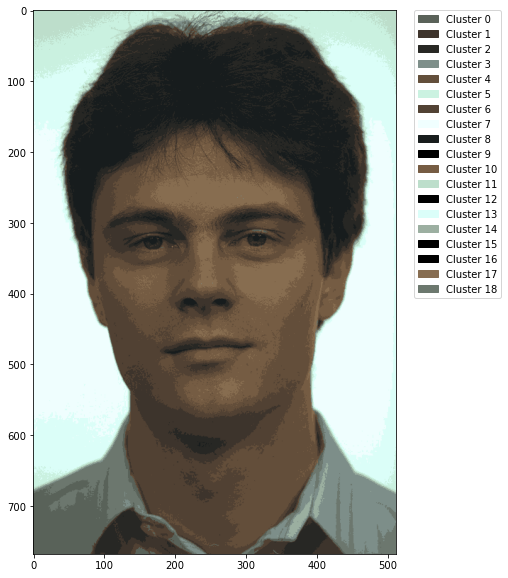

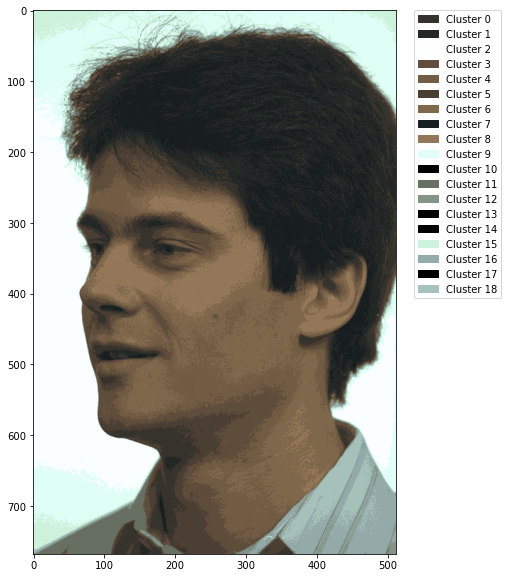

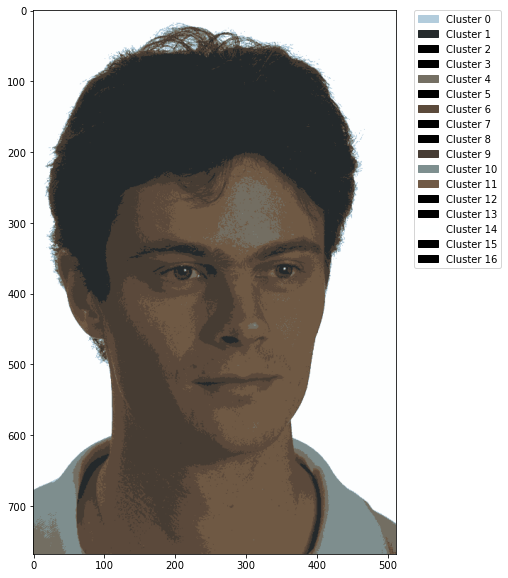

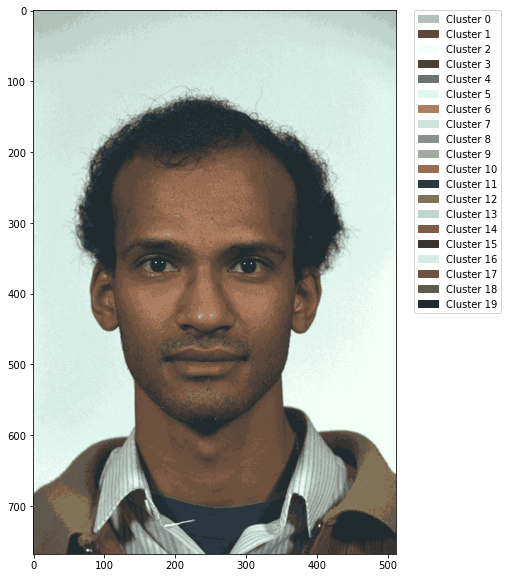

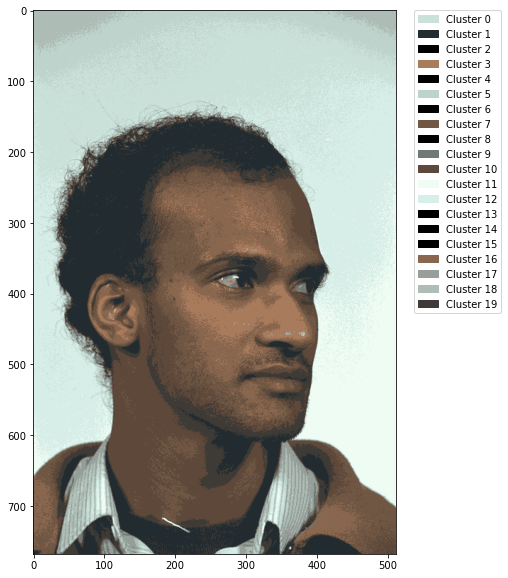

...

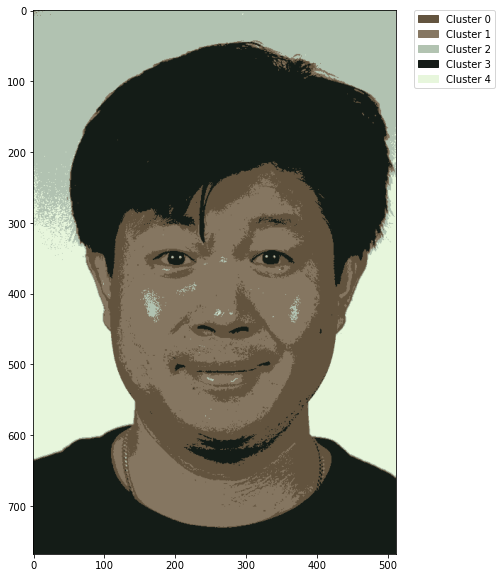

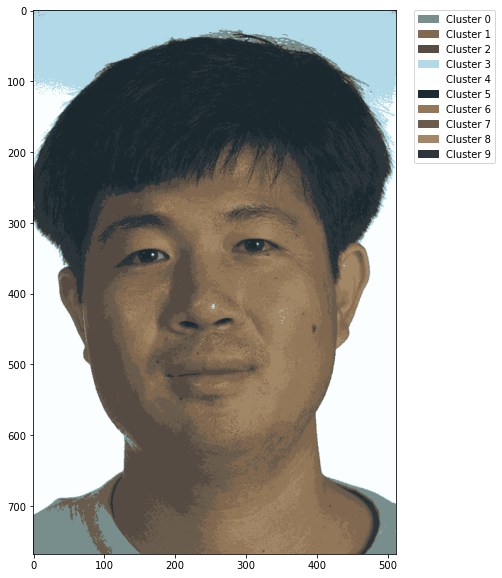

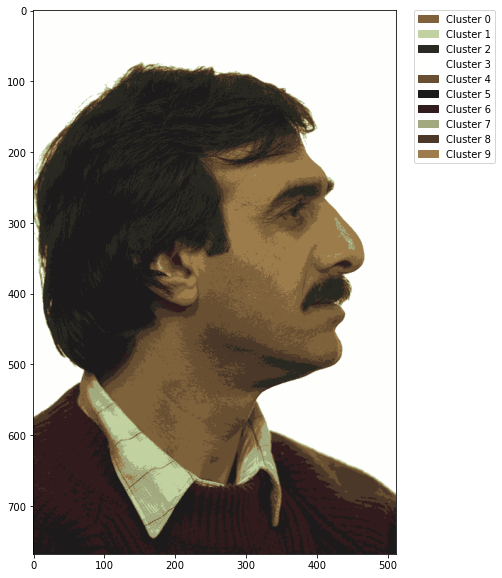

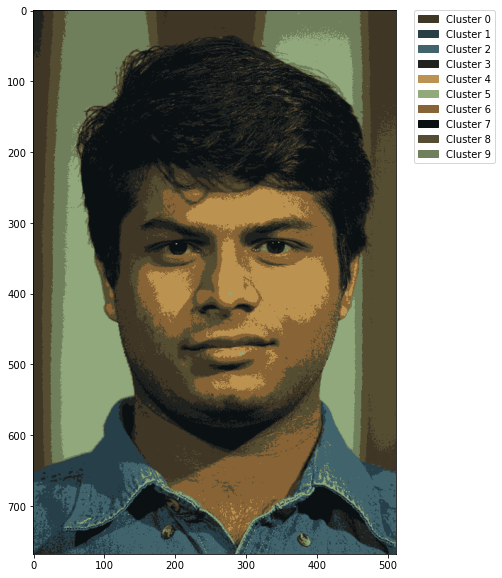

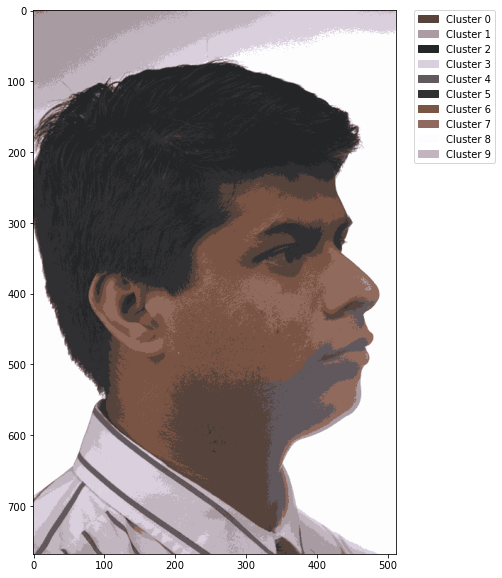

In [20]:
# Determined n_clusters for each image
n_clusters = [19, 19, 17, 20, 20, 16, 20, 14, 13, 20, 20, 20, 16, 15, 10, 5, 10, 10, 10, 10]
kmeans_models = []
for i, img in enumerate(imgs):
  kmeans_models.append(cluster_colors(img, n_clusters=n_clusters[i]))

cluster_ids = [
    [0, 1, 3, 5, 6],
    [4, 6, 12, 14, 15],
    [4, 13, 14],
    [1, 5, 7, 13, 15, 17],
    [1, 3, 5, 13, 18],
    [3, 5, 6, 13],
    [6, 8, 11, 16],
    [1, 3, 4, 5, 9, 13],
    [1, 2, 3, 8, 10],
    [0, 2, 3, 18],
    [2, 4, 6, 11, 15, 16, 17],
    [5, 10, 15, 16, 19],
    [2, 10, 11],
    [0, 2, 9, 13],
    [4, 5, 6, 8, 9],
    [0, 3],
    [2, 6, 9],
    [0, 1, 2, 7],
    [1, 4, 9],
    [0, 1, 5],
]


In [27]:
def create_binmask(img, kmeans, cluster_ids):
    color_vectors = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).reshape(-1, 3)
    labels = kmeans.predict(color_vectors).reshape(img.shape[:-1])
    mask = np.zeros(img.shape[:-1]).astype(np.uint8)
    for cluster in cluster_ids:
        mask[labels == cluster] = 255
    return mask


def save_binmask(binmask, fname="mask"):
    plt.imshow(binmask, cmap="gray")
    plt.savefig(fname)

masks = []


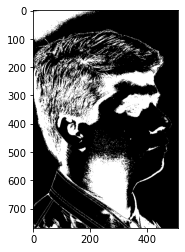

In [29]:
for i, img in enumerate(imgs):
    mask = create_binmask(img, kmeans=kmeans_models[i], cluster_ids=cluster_ids[i])
    save_binmask(mask, "Bin-Masks/mask_{0:03d}.png".format(i + 1))
    masks.append(mask)
     
     
np.save("generated-masks.npy", np.array(masks))